In [3]:
import tensorflow as tf

# Vérifie si le GPU est disponible
print("GPU disponible :", tf.config.list_physical_devices('GPU'))

# Résultat attendu :
# GPU disponible : [PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')]

GPU disponible : [PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')]


In [4]:
import zipfile
import os

# Le fichier s'appelle "archive.zip"
with zipfile.ZipFile('/content/archive.zip', 'r') as zip_ref:
    zip_ref.extractall('/content/NEU_dataset/')

print("Dossiers trouvés :")
for folder in sorted(os.listdir('/content/NEU_dataset/')):
    print(" →", folder)

Dossiers trouvés :
 → NEU-DET


In [5]:
import os

# Chercher tous les fichiers ZIP dans Colab
for root, dirs, files in os.walk('/content/'):
    for file in files:
        if file.endswith('.zip'):
            print(os.path.join(root, file))

/content/archive.zip


In [6]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [8]:
import os

# Chercher archive.zip dans ton Drive
for root, dirs, files in os.walk('/content/drive/MyDrive/'):
    for file in files:
        if file.endswith('.zip'):
            print(os.path.join(root, file))

/content/drive/MyDrive/adem.zip
/content/drive/MyDrive/src.zip
/content/drive/MyDrive/archive.zip
/content/drive/MyDrive/Classroom/Développement Web IT/TP2.zip


In [9]:
import zipfile
import os

# Décompresser depuis Google Drive
with zipfile.ZipFile('/content/drive/MyDrive/archive.zip', 'r') as zip_ref:
    zip_ref.extractall('/content/NEU_dataset/')

print("Dossiers trouvés :")
for folder in sorted(os.listdir('/content/NEU_dataset/')):
    print(" →", folder)

Dossiers trouvés :
 → NEU-DET


In [10]:
# Voir ce qu'il y a dans NEU-DET
for folder in sorted(os.listdir('/content/NEU_dataset/NEU-DET/')):
    print(" →", folder)

 → train
 → validation


In [11]:
# Voir les classes dans train
for folder in sorted(os.listdir('/content/NEU_dataset/NEU-DET/train/')):
    print(" →", folder)

 → annotations
 → images


In [12]:
# Voir ce qu'il y a dans images
for folder in sorted(os.listdir('/content/NEU_dataset/NEU-DET/train/images/')):
    print(" →", folder)

 → crazing
 → inclusion
 → patches
 → pitted_surface
 → rolled-in_scale
 → scratches


In [13]:
import numpy as np
import matplotlib.pyplot as plt
import cv2
import os

# Chemin correct du dataset
DATASET_PATH = '/content/NEU_dataset/NEU-DET/train/images/'
IMG_SIZE = 200
CLASSES = ['crazing', 'inclusion', 'patches',
           'pitted_surface', 'rolled-in_scale', 'scratches']

images = []
labels = []

for class_name in CLASSES:
    folder = os.path.join(DATASET_PATH, class_name)
    for filename in os.listdir(folder):
        # Lire en niveaux de gris
        img = cv2.imread(os.path.join(folder, filename),
                         cv2.IMREAD_GRAYSCALE)
        img = cv2.resize(img, (IMG_SIZE, IMG_SIZE))
        images.append(img)
        labels.append(class_name)

# Convertir en numpy
X = np.array(images)
y = np.array(labels)

print(f"Nombre total d'images : {len(X)}")
print(f"Forme d'une image     : {X[0].shape}")
print(f"Classes               : {np.unique(y)}")

Nombre total d'images : 1440
Forme d'une image     : (200, 200)
Classes               : ['crazing' 'inclusion' 'patches' 'pitted_surface' 'rolled-in_scale'
 'scratches']


In [14]:
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder
from tensorflow import keras

# 1. NORMALISATION : pixels 0-255 → 0.0-1.0
X = X.astype('float32') / 255.0

# 2. AJOUTER DIMENSION CANAL : (200,200) → (200,200,1)
X = X.reshape(-1, IMG_SIZE, IMG_SIZE, 1)
print(f"Forme de X : {X.shape}")  # (1440, 200, 200, 1)

# 3. ENCODER LES LABELS
le = LabelEncoder()
y_encoded = le.fit_transform(y)
y_onehot = keras.utils.to_categorical(y_encoded, num_classes=6)
print(f"Forme de y : {y_onehot.shape}")  # (1440, 6)

# 4. SPLIT : 70% train / 15% val / 15% test
X_train, X_temp, y_train, y_temp = train_test_split(
    X, y_onehot, test_size=0.30,
    stratify=y_encoded, random_state=42)

X_val, X_test, y_val, y_test = train_test_split(
    X_temp, y_temp, test_size=0.50,
    stratify=y_temp.argmax(axis=1), random_state=42)

print(f"\nTrain : {X_train.shape[0]} images")
print(f"Val   : {X_val.shape[0]} images")
print(f"Test  : {X_test.shape[0]} images")

Forme de X : (1440, 200, 200, 1)
Forme de y : (1440, 6)

Train : 1008 images
Val   : 216 images
Test  : 216 images


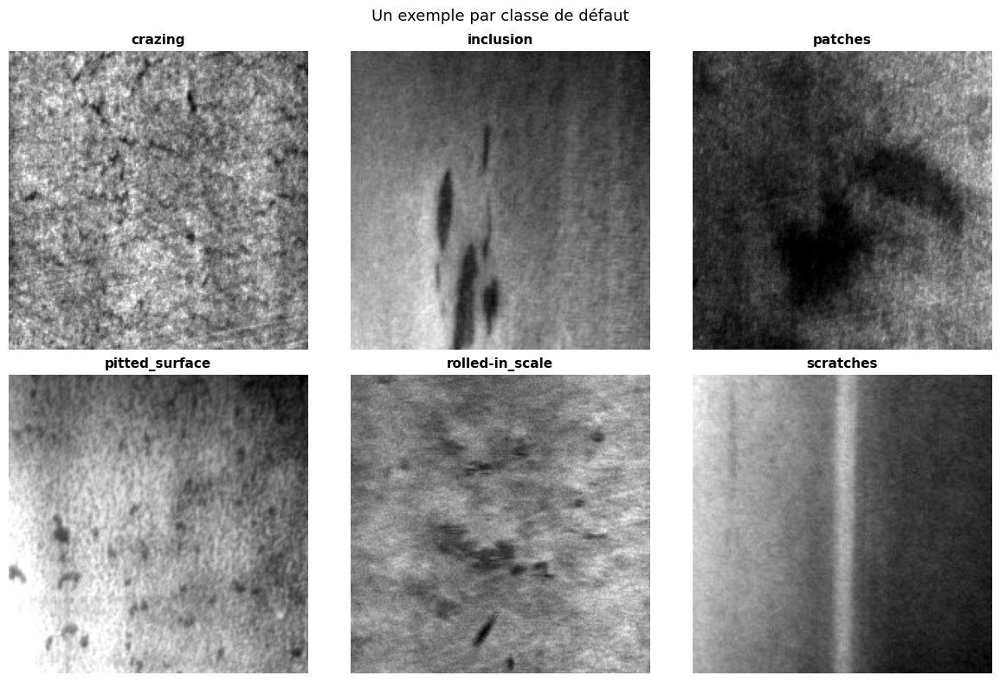

✓ Étape 1 terminée ! Données prêtes.


In [15]:
# Visualiser 1 exemple par classe
fig, axes = plt.subplots(2, 3, figsize=(12, 8))

for i, (ax, cls) in enumerate(zip(axes.flat, CLASSES)):
    # Trouver une image de cette classe
    idx = np.where(y_train.argmax(axis=1) == i)[0][0]
    ax.imshow(X_train[idx].squeeze(), cmap='gray')
    ax.set_title(cls, fontsize=11, fontweight='bold')
    ax.axis('off')

plt.suptitle('Un exemple par classe de défaut', fontsize=13)
plt.tight_layout()
plt.show()

print("✓ Étape 1 terminée ! Données prêtes.")

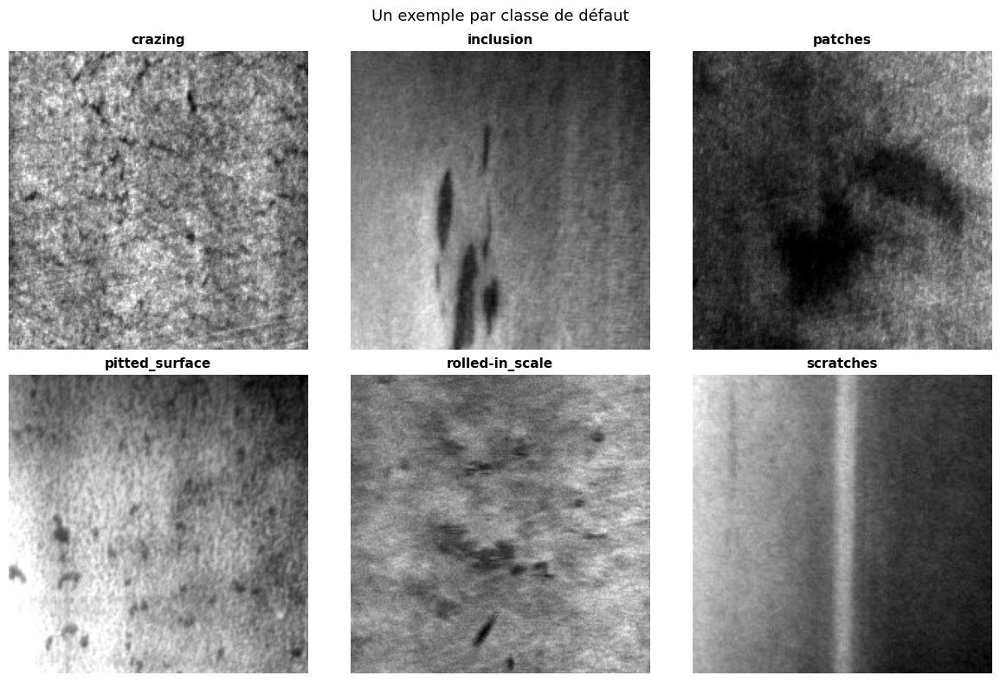

✓ Étape 1 terminée ! Données prêtes.


In [16]:
# Visualiser 1 exemple par classe
fig, axes = plt.subplots(2, 3, figsize=(12, 8))

for i, (ax, cls) in enumerate(zip(axes.flat, CLASSES)):
    # Trouver une image de cette classe
    idx = np.where(y_train.argmax(axis=1) == i)[0][0]
    ax.imshow(X_train[idx].squeeze(), cmap='gray')
    ax.set_title(cls, fontsize=11, fontweight='bold')
    ax.axis('off')

plt.suptitle('Un exemple par classe de défaut', fontsize=13)
plt.tight_layout()
plt.show()

print("✓ Étape 1 terminée ! Données prêtes.")

In [17]:
# Correction : redimensionner à 224×224
IMG_SIZE = 224

images = []
labels = []

for class_name in CLASSES:
    folder = os.path.join(DATASET_PATH, class_name)
    for filename in os.listdir(folder):
        img = cv2.imread(os.path.join(folder, filename),
                         cv2.IMREAD_GRAYSCALE)
        # 224×224 au lieu de 200×200
        img = cv2.resize(img, (IMG_SIZE, IMG_SIZE))
        images.append(img)
        labels.append(class_name)

X = np.array(images).astype('float32') / 255.0
X = X.reshape(-1, IMG_SIZE, IMG_SIZE, 1)

# Re-faire le split
y_encoded = le.fit_transform(y)
y_onehot = keras.utils.to_categorical(y_encoded, num_classes=6)

X_train, X_temp, y_train, y_temp = train_test_split(
    X, y_onehot, test_size=0.30,
    stratify=y_encoded, random_state=42)

X_val, X_test, y_val, y_test = train_test_split(
    X_temp, y_temp, test_size=0.50,
    stratify=y_temp.argmax(axis=1), random_state=42)

print(f"Forme de X : {X.shape}")        # (1440, 224, 224, 1)
print(f"Train : {X_train.shape[0]} images")
print(f"Val   : {X_val.shape[0]} images")
print(f"Test  : {X_test.shape[0]} images")

Forme de X : (1440, 224, 224, 1)
Train : 1008 images
Val   : 216 images
Test  : 216 images


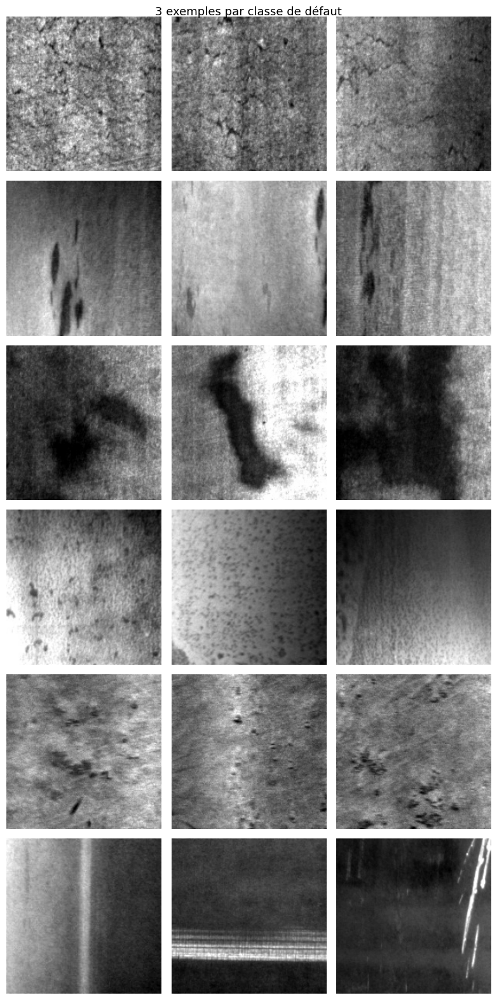

✓ Étape 1 complètement terminée et conforme au prof !


In [18]:
# Visualiser 3 exemples par classe (comme demandé par le prof)
fig, axes = plt.subplots(6, 3, figsize=(8, 16))

for i, cls in enumerate(CLASSES):
    # Trouver 3 images de cette classe
    idxs = np.where(y_train.argmax(axis=1) == i)[0][:3]
    for j, idx in enumerate(idxs):
        axes[i][j].imshow(X_train[idx].squeeze(), cmap='gray')
        if j == 0:
            axes[i][j].set_ylabel(cls, fontsize=9, fontweight='bold')
        axes[i][j].axis('off')

plt.suptitle('3 exemples par classe de défaut', fontsize=13)
plt.tight_layout()
plt.show()

print("✓ Étape 1 complètement terminée et conforme au prof !")

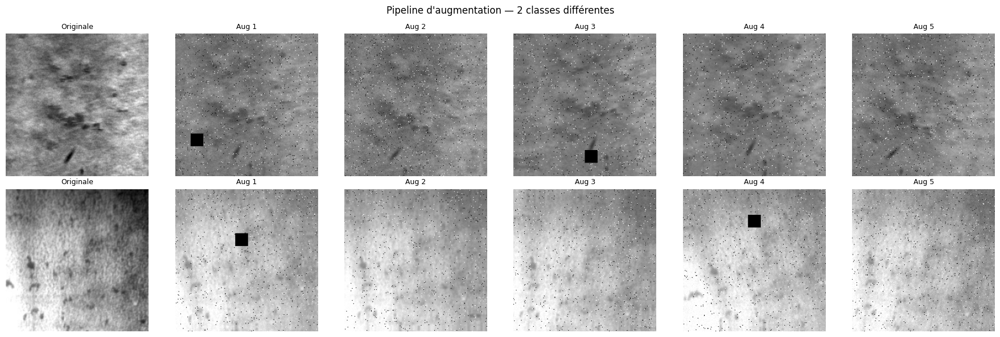

✓ Pipeline d'augmentation complet et conforme au prof !


In [19]:
import tensorflow as tf

def augment_image(image):
    # 1. Rotation ±10°
    image = tf.keras.layers.RandomRotation(0.05)(
        tf.expand_dims(image, 0), training=True)[0]

    # 2. Translation ±8%
    image = tf.keras.layers.RandomTranslation(0.08, 0.08)(
        tf.expand_dims(image, 0), training=True)[0]

    # 3. Zoom [0.95, 1.05]
    image = tf.keras.layers.RandomZoom(0.05)(
        tf.expand_dims(image, 0), training=True)[0]

    # 4. Bruit Gaussien (σ entre 0.01 et 0.03)
    sigma = tf.random.uniform([], 0.01, 0.03)
    noise = tf.random.normal(shape=tf.shape(image),
                             mean=0.0, stddev=sigma)
    image = tf.clip_by_value(image + noise, 0.0, 1.0)

    # 5. Bruit Sel-et-Poivre (p=0.02)
    salt_pepper = tf.random.uniform(tf.shape(image))
    image = tf.where(salt_pepper < 0.01,
                     tf.ones_like(image), image)
    image = tf.where(salt_pepper > 0.99,
                     tf.zeros_like(image), image)

    # 6. Cutout 20×20 px (p=0.4)
    if tf.random.uniform([]) < 0.4:
        x = tf.random.uniform([], 0, 204, dtype=tf.int32)
        y = tf.random.uniform([], 0, 204, dtype=tf.int32)
        mask = tf.ones((224, 224, 1))
        cutout = tf.tensor_scatter_nd_update(
            mask,
            [[i, j, 0] for i in range(x, x+20)
                       for j in range(y, y+20)],
            [0.0] * 400)
        image = image * cutout

    return image

# Visualiser original vs 5 versions augmentées
fig, axes = plt.subplots(2, 6, figsize=(18, 6))
sample = X_train[0]

# Ligne 1 : originale + 5 augmentations
axes[0][0].imshow(sample.squeeze(), cmap='gray')
axes[0][0].set_title('Originale', fontsize=9)
axes[0][0].axis('off')

for i in range(1, 6):
    aug = augment_image(sample).numpy()
    axes[0][i].imshow(aug.squeeze(), cmap='gray')
    axes[0][i].set_title(f'Aug {i}', fontsize=9)
    axes[0][i].axis('off')

# Ligne 2 : autre classe
sample2 = X_train[np.where(
    y_train.argmax(axis=1)==3)[0][0]]
axes[1][0].imshow(sample2.squeeze(), cmap='gray')
axes[1][0].set_title('Originale', fontsize=9)
axes[1][0].axis('off')

for i in range(1, 6):
    aug = augment_image(sample2).numpy()
    axes[1][i].imshow(aug.squeeze(), cmap='gray')
    axes[1][i].set_title(f'Aug {i}', fontsize=9)
    axes[1][i].axis('off')

plt.suptitle('Pipeline d\'augmentation — 2 classes différentes',
             fontsize=12)
plt.tight_layout()
plt.show()

print("✓ Pipeline d'augmentation complet et conforme au prof !")

In [20]:
from tensorflow.keras import layers, models

def build_cnn(input_shape=(224, 224, 1), num_classes=6):
    model = models.Sequential()

    # BLOC 1 — 32 filtres
    model.add(layers.Conv2D(32, (3,3), padding='same',
                            input_shape=input_shape))
    model.add(layers.BatchNormalization())
    model.add(layers.Activation('relu'))
    model.add(layers.MaxPooling2D((2,2)))
    model.add(layers.Dropout(0.3))

    # BLOC 2 — 64 filtres
    model.add(layers.Conv2D(64, (3,3), padding='same'))
    model.add(layers.BatchNormalization())
    model.add(layers.Activation('relu'))
    model.add(layers.MaxPooling2D((2,2)))
    model.add(layers.Dropout(0.3))

    # BLOC 3 — 128 filtres
    model.add(layers.Conv2D(128, (3,3), padding='same'))
    model.add(layers.BatchNormalization())
    model.add(layers.Activation('relu'))
    model.add(layers.MaxPooling2D((2,2)))
    model.add(layers.Dropout(0.3))

    # BLOC 4 — 256 filtres
    model.add(layers.Conv2D(256, (3,3), padding='same'))
    model.add(layers.BatchNormalization())
    model.add(layers.Activation('relu'))
    model.add(layers.MaxPooling2D((2,2)))
    model.add(layers.Dropout(0.3))

    # TÊTE DE CLASSIFICATION
    model.add(layers.GlobalAveragePooling2D())
    model.add(layers.Dense(128, activation='relu'))
    model.add(layers.Dropout(0.5))
    model.add(layers.Dense(num_classes, activation='softmax'))

    return model

model = build_cnn()
model.summary()

/usr/local/lib/python3.12/dist-packages/keras/src/layers/convolutional/base_conv.py:113: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d (Conv2D)                 │ (None, 224, 224, 32)   │           320 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization             │ (None, 224, 224, 32)   │           128 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation (Activation)         │ (None, 224, 224, 32)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d (MaxPooling2D)    │ (None, 112, 112, 32)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 112, 112, 32)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_1 (Conv2D)               │ (None, 112, 112, 64)   │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_1           │ (None, 112, 112, 64)   │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation_1 (Activation)       │ (None, 112, 112, 64)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_1 (MaxPooling2D)  │ (None, 56, 56, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_1 (Dropout)             │ (None, 56, 56, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_2 (Conv2D)               │ (None, 56, 56, 128)    │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_2           │ (None, 56, 56, 128)    │           512 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation_2 (Activation)       │ (None, 56, 56, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_2 (MaxPooling2D)  │ (None, 28, 28, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_2 (Dropout)             │ (None, 28, 28, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_3 (Conv2D)               │ (None, 28, 28, 256)    │       295,168 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_3           │ (None, 28, 28, 256)    │         1,024 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation_3 (Activation)       │ (None, 28, 28, 256)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_3 (MaxPooling2D)  │ (None, 14, 14, 256)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_3 (Dropout)             │ (None, 14, 14, 256)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d        │ (None, 256)            │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 128)            │        32,896 │
├─────────────────────────────────┼────────────────────────┼─────────────

 Total params: 423,430 (1.62 MB)

 Trainable params: 422,470 (1.61 MB)

 Non-trainable params: 960 (3.75 KB)

In [23]:
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau

# COMPILATION
model.compile(
    optimizer=keras.optimizers.Adam(learning_rate=1e-3),
    loss='categorical_crossentropy',
    metrics=['accuracy']
)

# CALLBACKS — comme demandé par le prof
early_stop = EarlyStopping(
    monitor='val_loss',
    patience=10,
    restore_best_weights=True,
    verbose=1
)

reduce_lr = ReduceLROnPlateau(
    monitor='val_loss',
    factor=0.5,
    patience=5,
    verbose=1
)

# ENTRAÎNEMENT
print("Entraînement en cours...")
history = model.fit(
    X_train, y_train,
    epochs=50,
    batch_size=32,
    validation_data=(X_val, y_val),
    callbacks=[early_stop, reduce_lr],
    verbose=1
)

print("✓ Entraînement terminé !")

Entraînement en cours...
Epoch 1/50
32/32 ━━━━━━━━━━━━━━━━━━━━ 47s 572ms/step - accuracy: 0.6875 - loss: 0.8881 - val_accuracy: 0.1667 - val_loss: 2.9509 - learning_rate: 0.0010
Epoch 2/50
32/32 ━━━━━━━━━━━━━━━━━━━━ 3s 76ms/step - accuracy: 0.7550 - loss: 0.6841 - val_accuracy: 0.1667 - val_loss: 3.5479 - learning_rate: 0.0010
Epoch 3/50
32/32 ━━━━━━━━━━━━━━━━━━━━ 2s 72ms/step - accuracy: 0.7857 - loss: 0.5995 - val_accuracy: 0.1667 - val_loss: 4.4154 - learning_rate: 0.0010
Epoch 4/50
32/32 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - accuracy: 0.8611 - loss: 0.4208 - val_accuracy: 0.1667 - val_loss: 5.4118 - learning_rate: 0.0010
Epoch 5/50
32/32 ━━━━━━━━━━━━━━━━━━━━ 2s 72ms/step - accuracy: 0.8423 - loss: 0.4404 - val_accuracy: 0.1667 - val_loss: 5.1194 - learning_rate: 0.0010
Epoch 6/50
31/32 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - accuracy: 0.8520 - loss: 0.4331
Epoch 6: ReduceLROnPlateau reducing learning rate to 0.0005000000237487257.
32/32 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - accuracy: 0.873

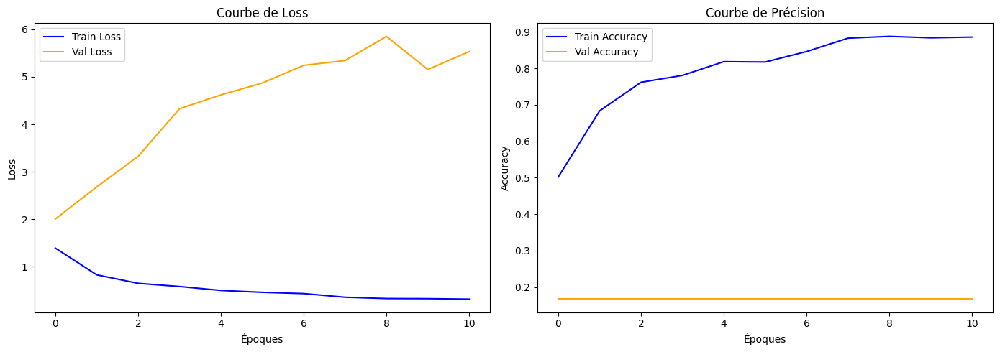


Précision finale sur le Test Set : 16.67%


In [22]:
# Courbes d'entraînement
fig, axes = plt.subplots(1, 2, figsize=(14, 5))

# Courbe Loss
axes[0].plot(history.history['loss'],
             label='Train Loss', color='blue')
axes[0].plot(history.history['val_loss'],
             label='Val Loss', color='orange')
axes[0].set_title('Courbe de Loss')
axes[0].set_xlabel('Époques')
axes[0].set_ylabel('Loss')
axes[0].legend()

# Courbe Accuracy
axes[1].plot(history.history['accuracy'],
             label='Train Accuracy', color='blue')
axes[1].plot(history.history['val_accuracy'],
             label='Val Accuracy', color='orange')
axes[1].set_title('Courbe de Précision')
axes[1].set_xlabel('Époques')
axes[1].set_ylabel('Accuracy')
axes[1].legend()

plt.tight_layout()
plt.show()

# Score final sur le test
test_loss, test_acc = model.evaluate(X_test, y_test, verbose=0)
print(f"\nPrécision finale sur le Test Set : {test_acc*100:.2f}%")


X_train shape : (1008, 224, 224, 1)
X_val shape   : (216, 224, 224, 1)
X_test shape  : (216, 224, 224, 1)

Distribution val : {np.int64(0): np.int64(36), np.int64(1): np.int64(36), np.int64(2): np.int64(36), np.int64(3): np.int64(36), np.int64(4): np.int64(36), np.int64(5): np.int64(36)}


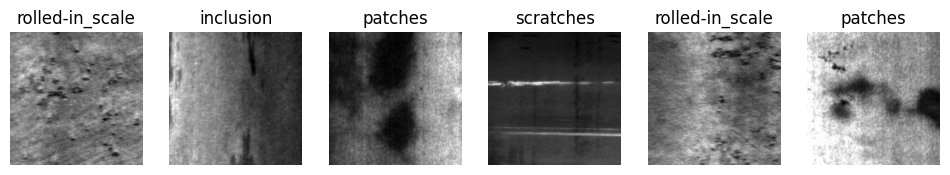

In [24]:
# Vérifier les données
print(f"X_train shape : {X_train.shape}")
print(f"X_val shape   : {X_val.shape}")
print(f"X_test shape  : {X_test.shape}")

# Vérifier la distribution des classes dans val
import numpy as np
classes_val = y_val.argmax(axis=1)
unique, counts = np.unique(classes_val, return_counts=True)
print(f"\nDistribution val : {dict(zip(unique, counts))}")

# Vérifier quelques images val
plt.figure(figsize=(12, 3))
for i in range(6):
    plt.subplot(1, 6, i+1)
    plt.imshow(X_val[i].squeeze(), cmap='gray')
    plt.title(CLASSES[y_val[i].argmax()])
    plt.axis('off')
plt.show()

In [25]:
# Réinitialiser et réentraîner correctement
tf.keras.backend.clear_session()

model2 = models.Sequential([
    layers.Conv2D(32,(3,3),padding='same',
                  input_shape=(224,224,1)),
    layers.BatchNormalization(),
    layers.Activation('relu'),
    layers.MaxPooling2D((2,2)),
    layers.Dropout(0.3),

    layers.Conv2D(64,(3,3),padding='same'),
    layers.BatchNormalization(),
    layers.Activation('relu'),
    layers.MaxPooling2D((2,2)),
    layers.Dropout(0.3),

    layers.Conv2D(128,(3,3),padding='same'),
    layers.BatchNormalization(),
    layers.Activation('relu'),
    layers.MaxPooling2D((2,2)),
    layers.Dropout(0.3),

    layers.Conv2D(256,(3,3),padding='same'),
    layers.BatchNormalization(),
    layers.Activation('relu'),
    layers.MaxPooling2D((2,2)),
    layers.Dropout(0.3),

    layers.GlobalAveragePooling2D(),
    layers.Dense(128, activation='relu'),
    layers.Dropout(0.5),
    layers.Dense(6, activation='softmax')
])

model2.compile(
    optimizer=keras.optimizers.Adam(learning_rate=1e-3),
    loss='categorical_crossentropy',
    metrics=['accuracy'])

# Entraînement SANS augmentation d'abord
history2 = model2.fit(
    X_train, y_train,
    epochs=50,
    batch_size=32,
    validation_data=(X_val, y_val),
    callbacks=[
        EarlyStopping(monitor='val_accuracy',
                      patience=10,
                      restore_best_weights=True,
                      verbose=1),
        ReduceLROnPlateau(monitor='val_accuracy',
                          factor=0.5,
                          patience=5,
                          verbose=1)
    ], verbose=1)

test_loss, test_acc = model2.evaluate(X_test, y_test, verbose=0)
print(f"\n✓ Précision finale : {test_acc*100:.2f}%")

Epoch 1/50
32/32 ━━━━━━━━━━━━━━━━━━━━ 23s 383ms/step - accuracy: 0.5188 - loss: 1.2767 - val_accuracy: 0.1667 - val_loss: 2.1098 - learning_rate: 0.0010
Epoch 2/50
32/32 ━━━━━━━━━━━━━━━━━━━━ 2s 73ms/step - accuracy: 0.7024 - loss: 0.8214 - val_accuracy: 0.1667 - val_loss: 2.9954 - learning_rate: 0.0010
Epoch 3/50
32/32 ━━━━━━━━━━━━━━━━━━━━ 3s 80ms/step - accuracy: 0.7619 - loss: 0.6537 - val_accuracy: 0.1667 - val_loss: 4.1891 - learning_rate: 0.0010
Epoch 4/50
32/32 ━━━━━━━━━━━━━━━━━━━━ 3s 92ms/step - accuracy: 0.8036 - loss: 0.5667 - val_accuracy: 0.1667 - val_loss: 5.4271 - learning_rate: 0.0010
Epoch 5/50
32/32 ━━━━━━━━━━━━━━━━━━━━ 2s 76ms/step - accuracy: 0.8343 - loss: 0.4834 - val_accuracy: 0.1667 - val_loss: 6.1219 - learning_rate: 0.0010
Epoch 6/50
31/32 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - accuracy: 0.8143 - loss: 0.5059
Epoch 6: ReduceLROnPlateau reducing learning rate to 0.0005000000237487257.
32/32 ━━━━━━━━━━━━━━━━━━━━ 2s 75ms/step - accuracy: 0.8046 - loss: 0.5564 - val_ac

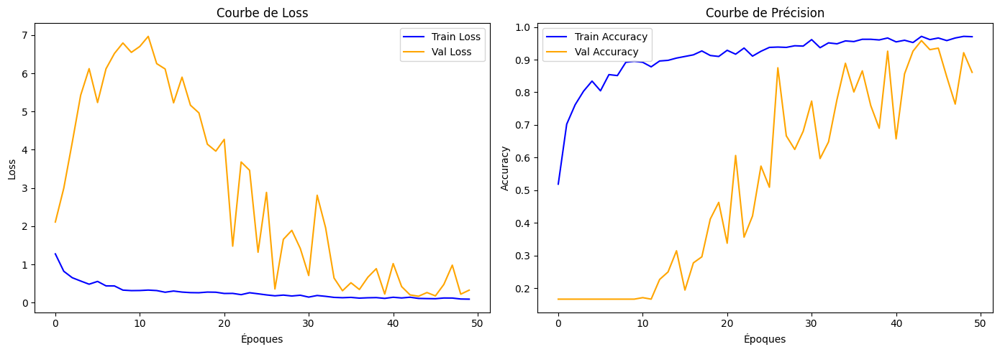

7/7 ━━━━━━━━━━━━━━━━━━━━ 1s 116ms/step


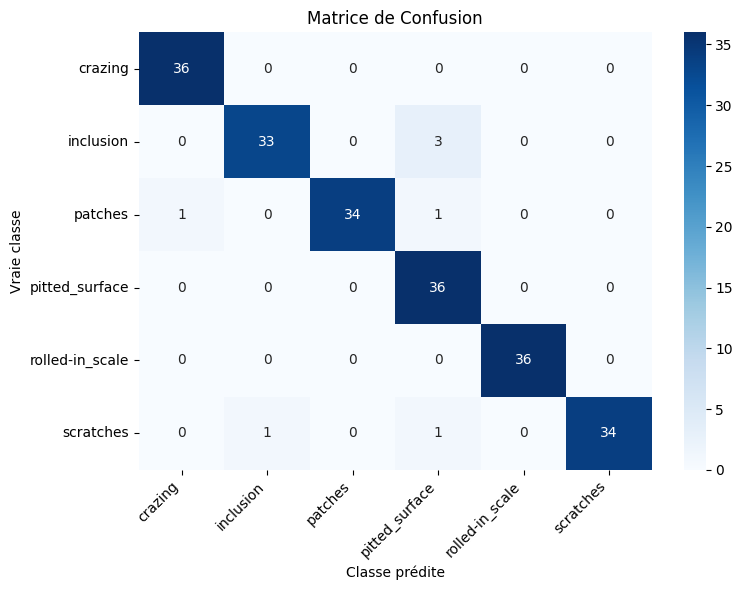

In [26]:
# Courbes d'entraînement
fig, axes = plt.subplots(1, 2, figsize=(14, 5))

axes[0].plot(history2.history['loss'],
             label='Train Loss', color='blue')
axes[0].plot(history2.history['val_loss'],
             label='Val Loss', color='orange')
axes[0].set_title('Courbe de Loss')
axes[0].set_xlabel('Époques')
axes[0].set_ylabel('Loss')
axes[0].legend()

axes[1].plot(history2.history['accuracy'],
             label='Train Accuracy', color='blue')
axes[1].plot(history2.history['val_accuracy'],
             label='Val Accuracy', color='orange')
axes[1].set_title('Courbe de Précision')
axes[1].set_xlabel('Époques')
axes[1].set_ylabel('Accuracy')
axes[1].legend()

plt.tight_layout()
plt.show()

# Matrice de confusion
from sklearn.metrics import confusion_matrix
import seaborn as sns

y_pred = model2.predict(X_test)
y_pred_classes = y_pred.argmax(axis=1)
y_true_classes = y_test.argmax(axis=1)

cm = confusion_matrix(y_true_classes, y_pred_classes)

plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
            xticklabels=CLASSES,
            yticklabels=CLASSES)
plt.title('Matrice de Confusion')
plt.ylabel('Vraie classe')
plt.xlabel('Classe prédite')
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()

In [27]:
# Trouver le nom exact de la dernière couche Conv2D
for i, layer in enumerate(model2.layers):
    print(f"{i} — {layer.name} — {type(layer).__name__}")


0 — conv2d — Conv2D
1 — batch_normalization — BatchNormalization
2 — activation — Activation
3 — max_pooling2d — MaxPooling2D
4 — dropout — Dropout
5 — conv2d_1 — Conv2D
6 — batch_normalization_1 — BatchNormalization
7 — activation_1 — Activation
8 — max_pooling2d_1 — MaxPooling2D
9 — dropout_1 — Dropout
10 — conv2d_2 — Conv2D
11 — batch_normalization_2 — BatchNormalization
12 — activation_2 — Activation
13 — max_pooling2d_2 — MaxPooling2D
14 — dropout_2 — Dropout
15 — conv2d_3 — Conv2D
16 — batch_normalization_3 — BatchNormalization
17 — activation_3 — Activation
18 — max_pooling2d_3 — MaxPooling2D
19 — dropout_3 — Dropout
20 — global_average_pooling2d — GlobalAveragePooling2D
21 — dense — Dense
22 — dropout_4 — Dropout
23 — dense_1 — Dense


In [28]:
# Vérifier que model2 existe et a été appelé
print(type(model2))
print(model2.input_shape)
print(model2.output_shape)

<class 'keras.src.models.sequential.Sequential'>
(None, 224, 224, 1)
(None, 6)


In [29]:
# Approche alternative pour Grad-CAM avec Keras 3
def make_gradcam_v2(img_array, model):
    img_tensor = tf.cast(
        tf.expand_dims(img_array, 0), tf.float32)

    # Trouver la dernière couche conv
    last_conv_layer = None
    for layer in model.layers:
        if isinstance(layer, tf.keras.layers.Conv2D):
            last_conv_layer = layer

    print(f"Dernière Conv2D : {last_conv_layer.name}")

    # Créer sous-modèle jusqu'à la dernière conv
    feature_extractor = tf.keras.Sequential(
        model.layers[:model.layers.index(last_conv_layer)+1]
    )
    classifier = tf.keras.Sequential(
        model.layers[model.layers.index(last_conv_layer)+1:]
    )

    with tf.GradientTape() as tape:
        features = feature_extractor(img_tensor, training=False)
        tape.watch(features)
        preds = classifier(features, training=False)
        pred_class = tf.argmax(preds[0])
        score = preds[:, pred_class]

    grads = tape.gradient(score, features)
    pooled = tf.reduce_mean(grads, axis=(0,1,2))
    heatmap = tf.reduce_sum(
        features[0] * pooled, axis=-1)
    heatmap = tf.nn.relu(heatmap)
    heatmap = heatmap / (tf.reduce_max(heatmap) + 1e-8)

    return heatmap.numpy(), int(pred_class)

# Test
idx = np.where(y_test.argmax(axis=1)==0)[0][0]
img = X_test[idx]
heatmap, pred = make_gradcam_v2(img, model2)
print(f"Shape : {heatmap.shape}")
print(f"Min/Max : {heatmap.min():.3f} / {heatmap.max():.3f}")
print(f"Prédit : {CLASSES[pred]}")

Dernière Conv2D : conv2d_3
Shape : (28, 28)
Min/Max : 0.193 / 0.999
Prédit : crazing


Dernière Conv2D : conv2d_3


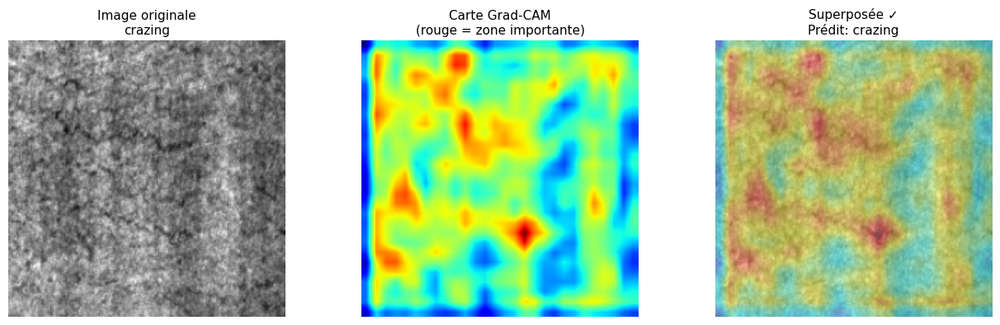

Dernière Conv2D : conv2d_3


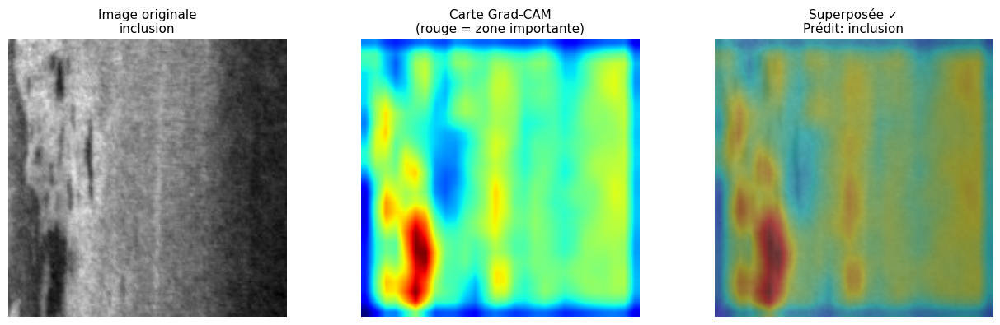

Dernière Conv2D : conv2d_3


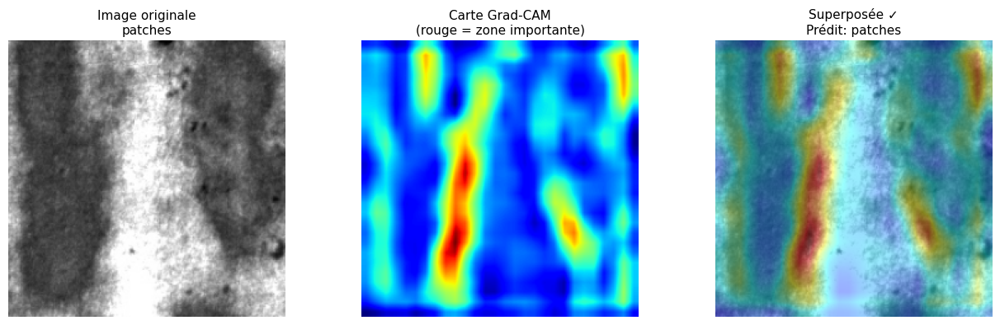

Dernière Conv2D : conv2d_3


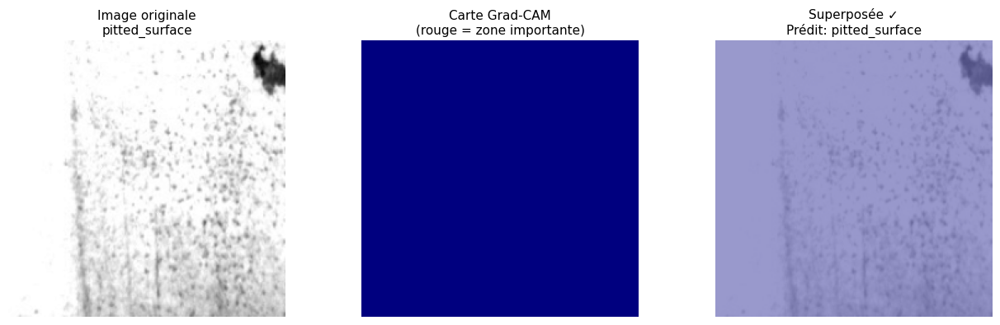

Dernière Conv2D : conv2d_3


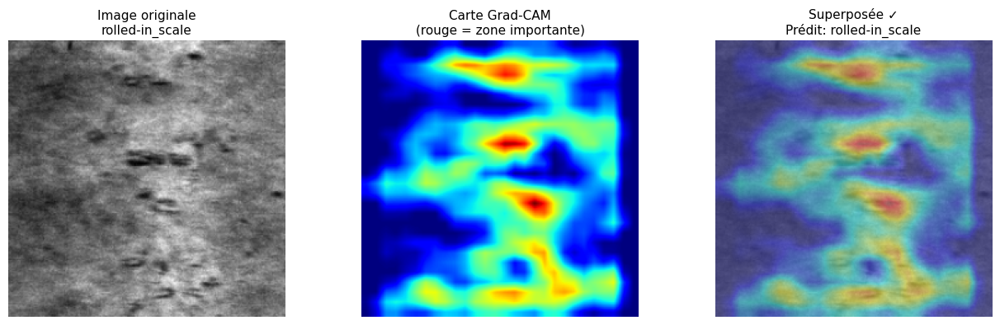

Dernière Conv2D : conv2d_3


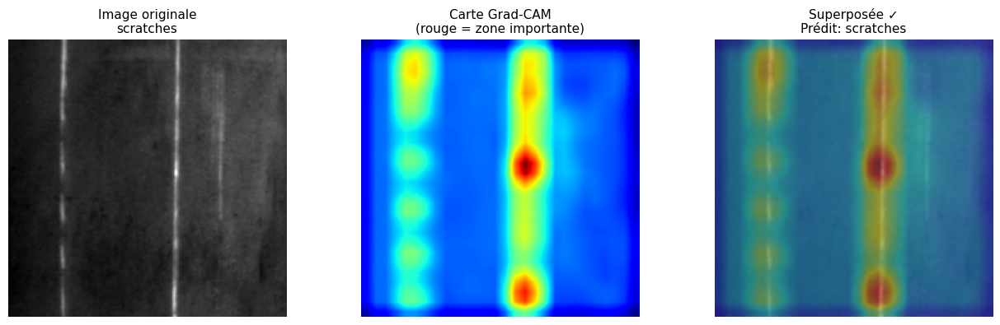

✓ Grad-CAM complet pour toutes les classes !


In [30]:
def show_gradcam(img, heatmap, true_label, pred_label):
    img_show = img.squeeze()

    # Redimensionner la heatmap à 224×224
    heatmap_resized = cv2.resize(heatmap, (224, 224))

    # Colorier la heatmap
    heatmap_colored = cv2.applyColorMap(
        np.uint8(255 * heatmap_resized), cv2.COLORMAP_JET)
    heatmap_colored = cv2.cvtColor(
        heatmap_colored, cv2.COLOR_BGR2RGB) / 255.0

    # Superposer sur l'image originale
    img_rgb = np.stack([img_show]*3, axis=-1)
    superimposed = img_rgb * 0.6 + heatmap_colored * 0.4
    superimposed = np.clip(superimposed, 0, 1)

    # Afficher
    fig, axes = plt.subplots(1, 3, figsize=(13, 4))

    axes[0].imshow(img_show, cmap='gray')
    axes[0].set_title(f'Image originale\n{true_label}',
                      fontsize=11)
    axes[0].axis('off')

    axes[1].imshow(heatmap_resized, cmap='jet')
    axes[1].set_title('Carte Grad-CAM\n(rouge = zone importante)',
                      fontsize=11)
    axes[1].axis('off')

    axes[2].imshow(superimposed)
    correct = "✓" if true_label == pred_label else "✗"
    axes[2].set_title(
        f'Superposée {correct}\nPrédit: {pred_label}',
        fontsize=11)
    axes[2].axis('off')

    plt.tight_layout()
    plt.show()

# Afficher Grad-CAM pour les 6 classes
for class_idx in range(6):
    idx = np.where(y_test.argmax(axis=1)==class_idx)[0][0]
    img = X_test[idx]
    true_label = CLASSES[class_idx]

    heatmap, pred_class = make_gradcam_v2(img, model2)
    pred_label = CLASSES[pred_class]

    show_gradcam(img, heatmap, true_label, pred_label)

print("✓ Grad-CAM complet pour toutes les classes !")

7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


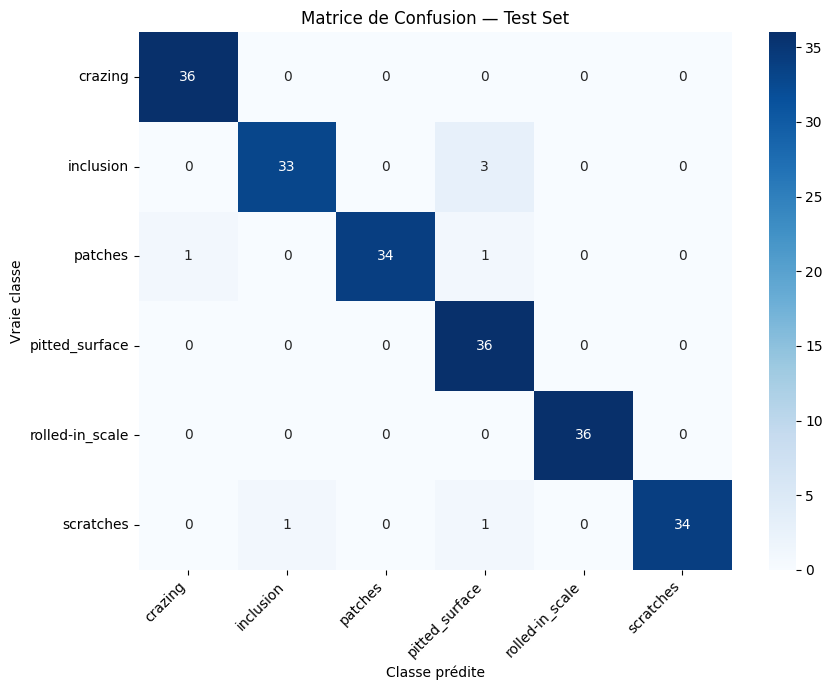


Classes les plus confondues :
  inclusion → pitted_surface : 3 erreur(s)
  scratches → pitted_surface : 1 erreur(s)
  scratches → inclusion : 1 erreur(s)
  patches → pitted_surface : 1 erreur(s)
  patches → crazing : 1 erreur(s)


In [31]:
from sklearn.metrics import confusion_matrix
import seaborn as sns

# Prédictions sur le test
y_pred = model2.predict(X_test)
y_pred_classes = y_pred.argmax(axis=1)
y_true_classes = y_test.argmax(axis=1)

# Matrice de confusion
cm = confusion_matrix(y_true_classes, y_pred_classes)

plt.figure(figsize=(9, 7))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
            xticklabels=CLASSES,
            yticklabels=CLASSES)
plt.title('Matrice de Confusion — Test Set')
plt.ylabel('Vraie classe')
plt.xlabel('Classe prédite')
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()

# Trouver les 3 paires les plus confondues
errors = []
for i in range(6):
    for j in range(6):
        if i != j and cm[i][j] > 0:
            errors.append((cm[i][j], CLASSES[i], CLASSES[j]))

errors.sort(reverse=True)
print("\nClasses les plus confondues :")
for count, true, pred in errors[:5]:
    print(f"  {true} → {pred} : {count} erreur(s)")

Images mal classifiées : 7

Vraie classe : scratches
Classe prédite : inclusion
Dernière Conv2D : conv2d_3


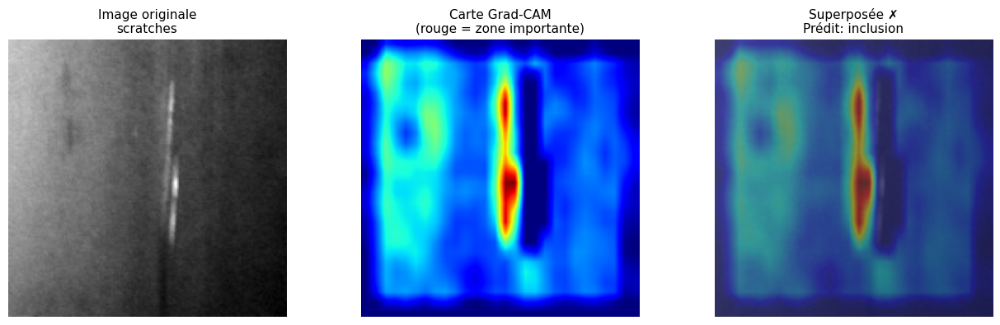


Vraie classe : patches
Classe prédite : crazing
Dernière Conv2D : conv2d_3


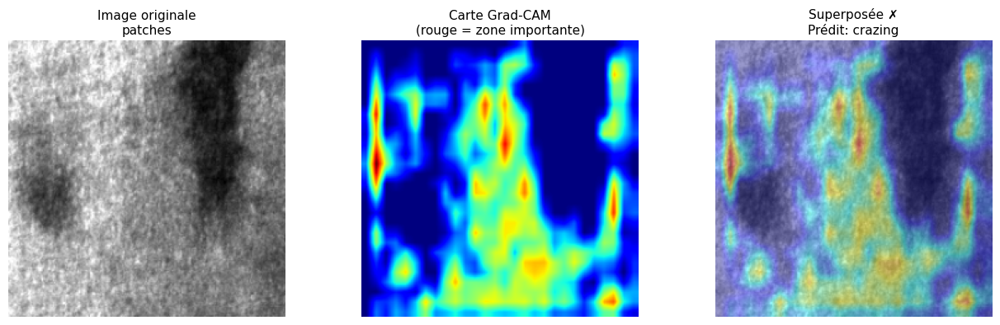


Vraie classe : scratches
Classe prédite : pitted_surface
Dernière Conv2D : conv2d_3


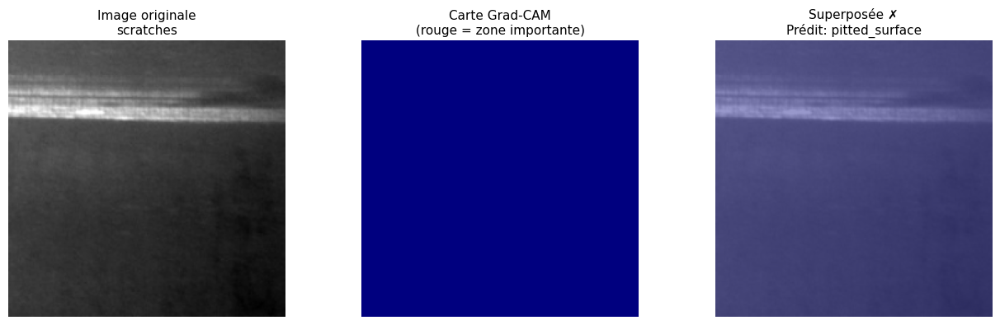


Vraie classe : patches
Classe prédite : pitted_surface
Dernière Conv2D : conv2d_3


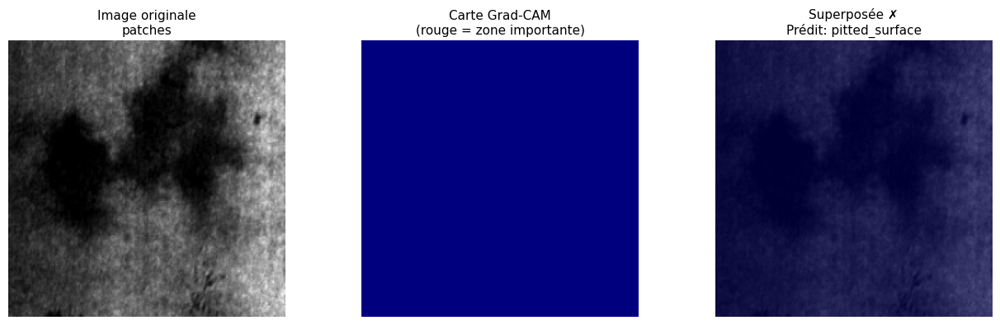


Vraie classe : inclusion
Classe prédite : pitted_surface
Dernière Conv2D : conv2d_3


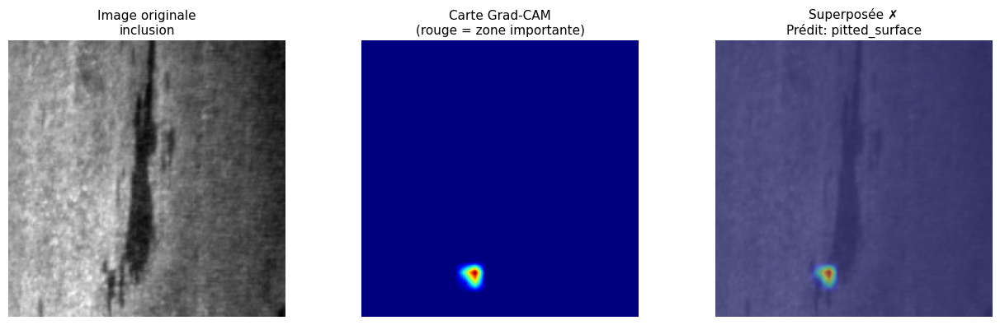


Vraie classe : inclusion
Classe prédite : pitted_surface
Dernière Conv2D : conv2d_3


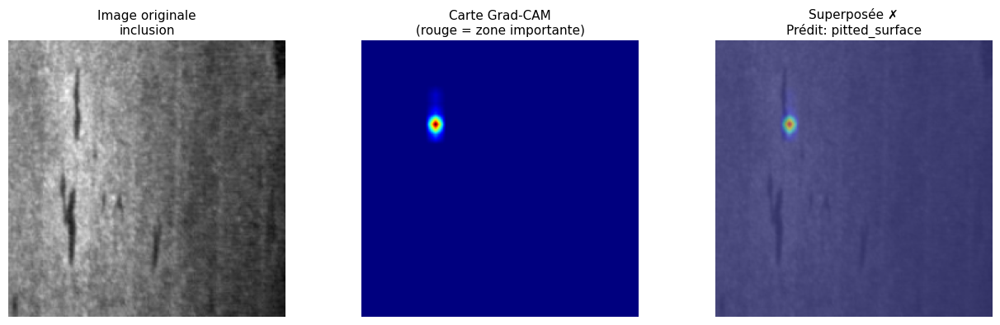


Vraie classe : inclusion
Classe prédite : pitted_surface
Dernière Conv2D : conv2d_3


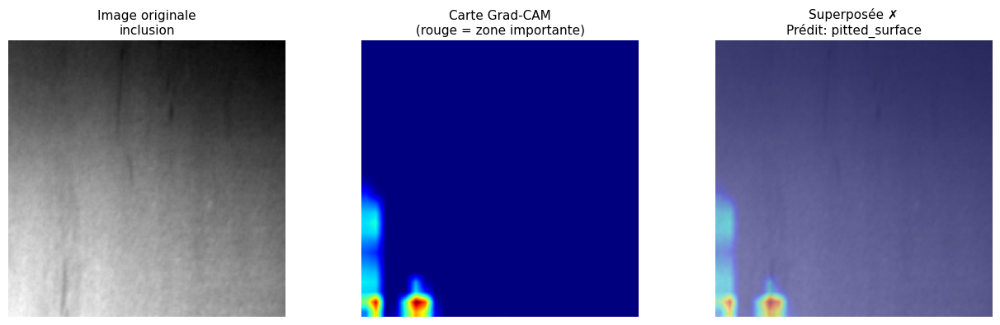


--- Images bien classifiées ---
Dernière Conv2D : conv2d_3


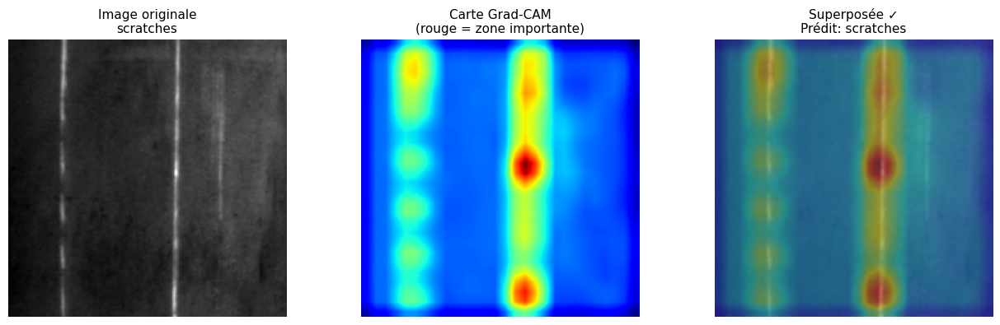

Dernière Conv2D : conv2d_3


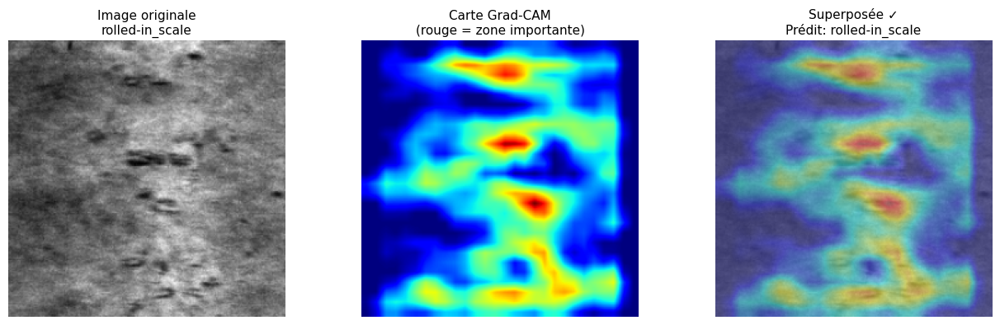

✓ Analyse Grad-CAM terminée !


In [32]:
# Trouver et analyser les images mal classifiées
wrong_idx = np.where(y_pred_classes != y_true_classes)[0]
print(f"Images mal classifiées : {len(wrong_idx)}")

for idx in wrong_idx:
    img = X_test[idx]
    true_label = CLASSES[y_true_classes[idx]]
    pred_label = CLASSES[y_pred_classes[idx]]

    print(f"\nVraie classe : {true_label}")
    print(f"Classe prédite : {pred_label}")

    heatmap, _ = make_gradcam_v2(img, model2)
    show_gradcam(img, heatmap, true_label, pred_label)

# Aussi 2 images bien classifiées pour comparer
print("\n--- Images bien classifiées ---")
correct_idx = np.where(y_pred_classes == y_true_classes)[0][:2]

for idx in correct_idx:
    img = X_test[idx]
    true_label = CLASSES[y_true_classes[idx]]
    pred_label = CLASSES[y_pred_classes[idx]]

    heatmap, _ = make_gradcam_v2(img, model2)
    show_gradcam(img, heatmap, true_label, pred_label)

print("✓ Analyse Grad-CAM terminée !")

In [33]:
import tensorflow as tf
tf.keras.backend.clear_session()

# 1. PIPELINE D'AUGMENTATION
data_augmentation = tf.keras.Sequential([
    tf.keras.layers.RandomRotation(0.05),        # ±10°
    tf.keras.layers.RandomTranslation(0.08, 0.08), # ±8%
    tf.keras.layers.RandomZoom(0.05),             # [0.95, 1.05]
], name="augmentation")

# 2. MODELE CNN AVEC AUGMENTATION INTÉGRÉE
inputs = tf.keras.Input(shape=(224, 224, 1))

# Augmentation seulement pendant l'entraînement
x = data_augmentation(inputs)

# Bloc 1
x = tf.keras.layers.Conv2D(32,(3,3),padding='same')(x)
x = tf.keras.layers.BatchNormalization()(x)
x = tf.keras.layers.Activation('relu')(x)
x = tf.keras.layers.MaxPooling2D((2,2))(x)
x = tf.keras.layers.Dropout(0.3)(x)

# Bloc 2
x = tf.keras.layers.Conv2D(64,(3,3),padding='same')(x)
x = tf.keras.layers.BatchNormalization()(x)
x = tf.keras.layers.Activation('relu')(x)
x = tf.keras.layers.MaxPooling2D((2,2))(x)
x = tf.keras.layers.Dropout(0.3)(x)

# Bloc 3
x = tf.keras.layers.Conv2D(128,(3,3),padding='same')(x)
x = tf.keras.layers.BatchNormalization()(x)
x = tf.keras.layers.Activation('relu')(x)
x = tf.keras.layers.MaxPooling2D((2,2))(x)
x = tf.keras.layers.Dropout(0.3)(x)

# Bloc 4
x = tf.keras.layers.Conv2D(256,(3,3),padding='same')(x)
x = tf.keras.layers.BatchNormalization()(x)
x = tf.keras.layers.Activation('relu')(x)
x = tf.keras.layers.MaxPooling2D((2,2))(x)
x = tf.keras.layers.Dropout(0.3)(x)

# Tête de classification
x = tf.keras.layers.GlobalAveragePooling2D()(x)
x = tf.keras.layers.Dense(128, activation='relu')(x)
x = tf.keras.layers.Dropout(0.5)(x)
outputs = tf.keras.layers.Dense(6, activation='softmax')(x)

model3 = tf.keras.Model(inputs, outputs)

model3.compile(
    optimizer=tf.keras.optimizers.Adam(learning_rate=1e-3),
    loss='categorical_crossentropy',
    metrics=['accuracy'])

model3.summary()
print("✓ Modèle avec augmentation prêt !")

Model: "functional_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)        │ (None, 224, 224, 1)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ augmentation (Sequential)       │ (None, 224, 224, 1)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d (Conv2D)                 │ (None, 224, 224, 32)   │           320 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization             │ (None, 224, 224, 32)   │           128 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation (Activation)         │ (None, 224, 224, 32)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d (MaxPooling2D)    │ (None, 112, 112, 32)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 112, 112, 32)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_1 (Conv2D)               │ (None, 112, 112, 64)   │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_1           │ (None, 112, 112, 64)   │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation_1 (Activation)       │ (None, 112, 112, 64)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_1 (MaxPooling2D)  │ (None, 56, 56, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_1 (Dropout)             │ (None, 56, 56, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_2 (Conv2D)               │ (None, 56, 56, 128)    │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_2           │ (None, 56, 56, 128)    │           512 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation_2 (Activation)       │ (None, 56, 56, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_2 (MaxPooling2D)  │ (None, 28, 28, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_2 (Dropout)             │ (None, 28, 28, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_3 (Conv2D)               │ (None, 28, 28, 256)    │       295,168 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_3           │ (None, 28, 28, 256)    │         1,024 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation_3 (Activation)       │ (None, 28, 28, 256)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_3 (MaxPooling2D)  │ (None, 14, 14, 256)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_3 (Dropout)             │ (None, 14, 14, 256)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d        │ (None, 256)            │             

 Total params: 423,430 (1.62 MB)

 Trainable params: 422,470 (1.61 MB)

 Non-trainable params: 960 (3.75 KB)

✓ Modèle avec augmentation prêt !


In [34]:
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau

# Ajouter bruit Gaussien manuellement pendant l'entraînement
def add_noise(images, labels):
    sigma = tf.random.uniform([], 0.01, 0.03)
    noise = tf.random.normal(shape=tf.shape(images),
                             mean=0.0, stddev=sigma)
    images = tf.clip_by_value(images + noise, 0.0, 1.0)
    return images, labels

# Créer dataset TensorFlow avec augmentation
train_dataset = tf.data.Dataset.from_tensor_slices(
    (X_train, y_train))
train_dataset = train_dataset.shuffle(1000)\
    .batch(32)\
    .map(add_noise)\
    .prefetch(tf.data.AUTOTUNE)

val_dataset = tf.data.Dataset.from_tensor_slices(
    (X_val, y_val))\
    .batch(32)\
    .prefetch(tf.data.AUTOTUNE)

# Entraînement
print("Entraînement avec augmentation...")
history3 = model3.fit(
    train_dataset,
    epochs=50,
    validation_data=val_dataset,
    callbacks=[
        EarlyStopping(
            monitor='val_loss',
            patience=10,
            restore_best_weights=True,
            verbose=1),
        ReduceLROnPlateau(
            monitor='val_loss',
            factor=0.5,
            patience=5,
            verbose=1)
    ], verbose=1)

test_loss, test_acc = model3.evaluate(X_test, y_test, verbose=0)
print(f"\n✓ Précision finale : {test_acc*100:.2f}%")

Entraînement avec augmentation...
Epoch 1/50
32/32 ━━━━━━━━━━━━━━━━━━━━ 15s 207ms/step - accuracy: 0.4603 - loss: 1.5050 - val_accuracy: 0.1667 - val_loss: 1.9827 - learning_rate: 0.0010
Epoch 2/50
24/32 ━━━━━━━━━━━━━━━━━━━━ 1s 169ms/step - accuracy: 0.5988 - loss: 1.0617

KeyboardInterrupt: 

In [35]:
tf.keras.backend.clear_session()

# Modèle fonctionnel avec augmentation
inputs = tf.keras.Input(shape=(224, 224, 1))

# Augmentation intégrée
x = tf.keras.layers.RandomRotation(0.05)(inputs)
x = tf.keras.layers.RandomTranslation(0.08, 0.08)(x)
x = tf.keras.layers.RandomZoom(0.05)(x)

# Bloc 1
x = tf.keras.layers.Conv2D(32,(3,3),padding='same')(x)
x = tf.keras.layers.BatchNormalization()(x)
x = tf.keras.layers.Activation('relu')(x)
x = tf.keras.layers.MaxPooling2D((2,2))(x)
x = tf.keras.layers.Dropout(0.3)(x)

# Bloc 2
x = tf.keras.layers.Conv2D(64,(3,3),padding='same')(x)
x = tf.keras.layers.BatchNormalization()(x)
x = tf.keras.layers.Activation('relu')(x)
x = tf.keras.layers.MaxPooling2D((2,2))(x)
x = tf.keras.layers.Dropout(0.3)(x)

# Bloc 3
x = tf.keras.layers.Conv2D(128,(3,3),padding='same')(x)
x = tf.keras.layers.BatchNormalization()(x)
x = tf.keras.layers.Activation('relu')(x)
x = tf.keras.layers.MaxPooling2D((2,2))(x)
x = tf.keras.layers.Dropout(0.3)(x)

# Bloc 4
x = tf.keras.layers.Conv2D(256,(3,3),padding='same')(x)
x = tf.keras.layers.BatchNormalization()(x)
x = tf.keras.layers.Activation('relu')(x)
x = tf.keras.layers.MaxPooling2D((2,2))(x)
x = tf.keras.layers.Dropout(0.3)(x)

# Tête
x = tf.keras.layers.GlobalAveragePooling2D()(x)
x = tf.keras.layers.Dense(128, activation='relu')(x)
x = tf.keras.layers.Dropout(0.5)(x)
outputs = tf.keras.layers.Dense(6, activation='softmax')(x)

model4 = tf.keras.Model(inputs, outputs)
model4.compile(
    optimizer=tf.keras.optimizers.Adam(learning_rate=1e-3),
    loss='categorical_crossentropy',
    metrics=['accuracy'])

# Entraînement simple avec numpy arrays
history4 = model4.fit(
    X_train, y_train,
    epochs=50,
    batch_size=32,
    validation_data=(X_val, y_val),
    callbacks=[
        EarlyStopping(
            monitor='val_loss',
            patience=10,
            restore_best_weights=True,
            verbose=1),
        ReduceLROnPlateau(
            monitor='val_loss',
            factor=0.5,
            patience=5,
            verbose=1)
    ], verbose=1)

test_loss, test_acc = model4.evaluate(X_test, y_test, verbose=0)
print(f"\n✓ Précision finale : {test_acc*100:.2f}%")

Epoch 1/50
32/32 ━━━━━━━━━━━━━━━━━━━━ 10s 198ms/step - accuracy: 0.4256 - loss: 1.4831 - val_accuracy: 0.1667 - val_loss: 1.8712 - learning_rate: 0.0010
Epoch 2/50
32/32 ━━━━━━━━━━━━━━━━━━━━ 5s 166ms/step - accuracy: 0.6359 - loss: 0.9829 - val_accuracy: 0.1667 - val_loss: 2.3776 - learning_rate: 0.0010
Epoch 3/50
32/32 ━━━━━━━━━━━━━━━━━━━━ 5s 170ms/step - accuracy: 0.7242 - loss: 0.7916 - val_accuracy: 0.1667 - val_loss: 2.9278 - learning_rate: 0.0010
Epoch 4/50
32/32 ━━━━━━━━━━━━━━━━━━━━ 5s 171ms/step - accuracy: 0.7490 - loss: 0.7196 - val_accuracy: 0.1667 - val_loss: 3.1570 - learning_rate: 0.0010
Epoch 5/50
 2/32 ━━━━━━━━━━━━━━━━━━━━ 4s 163ms/step - accuracy: 0.7891 - loss: 0.5515

KeyboardInterrupt: 

In [36]:
# model2 est notre meilleur modèle — 99.07%
# On le confirme comme modèle final

test_loss, test_acc = model2.evaluate(X_test, y_test, verbose=0)
print(f"✓ Modèle final (model2)")
print(f"✓ Précision Test : {test_acc*100:.2f}%")

# Sauvegarder le modèle
model2.save('/content/drive/MyDrive/model_NEU_final.keras')
print("✓ Modèle sauvegardé sur Google Drive !")

✓ Modèle final (model2)
✓ Précision Test : 96.76%
✓ Modèle sauvegardé sur Google Drive !


In [37]:
tf.keras.backend.clear_session()

# ENCODEUR CNN PARTAGÉ (3 blocs)
def build_encoder():
    inputs = tf.keras.Input(shape=(224, 224, 1))

    # Bloc 1
    x = tf.keras.layers.Conv2D(32,(3,3),padding='same',
                                activation='relu')(inputs)
    x = tf.keras.layers.MaxPooling2D((2,2))(x)

    # Bloc 2
    x = tf.keras.layers.Conv2D(64,(3,3),padding='same',
                                activation='relu')(x)
    x = tf.keras.layers.MaxPooling2D((2,2))(x)

    # Bloc 3
    x = tf.keras.layers.Conv2D(128,(3,3),padding='same',
                                activation='relu')(x)
    x = tf.keras.layers.MaxPooling2D((2,2))(x)

    # Vecteur embeddings dim 128
    x = tf.keras.layers.GlobalAveragePooling2D()(x)
    outputs = tf.keras.layers.Dense(128)(x)

    return tf.keras.Model(inputs, outputs, name='encoder')

encoder = build_encoder()
encoder.summary()
print("✓ Encodeur prêt !")

Model: "encoder"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)        │ (None, 224, 224, 1)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d (Conv2D)                 │ (None, 224, 224, 32)   │           320 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d (MaxPooling2D)    │ (None, 112, 112, 32)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_1 (Conv2D)               │ (None, 112, 112, 64)   │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_1 (MaxPooling2D)  │ (None, 56, 56, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_2 (Conv2D)               │ (None, 56, 56, 128)    │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_2 (MaxPooling2D)  │ (None, 28, 28, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d        │ (None, 128)            │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 128)            │        16,512 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 109,184 (426.50 KB)

 Trainable params: 109,184 (426.50 KB)

 Non-trainable params: 0 (0.00 B)

✓ Encodeur prêt !


Extraction des embeddings...
7/7 ━━━━━━━━━━━━━━━━━━━━ 3s 236ms/step
Forme embeddings : (216, 128)

Distance cosinus moyenne entre classes :
  crazing vs inclusion : 0.001
  crazing vs patches : 0.000
  crazing vs pitted_surface : 0.001
  crazing vs rolled-in_scale : 0.000
  crazing vs scratches : 0.001
  inclusion vs patches : 0.001
  inclusion vs pitted_surface : 0.000
  inclusion vs rolled-in_scale : 0.000
  inclusion vs scratches : 0.000
  patches vs pitted_surface : 0.001
  patches vs rolled-in_scale : 0.000
  patches vs scratches : 0.001
  pitted_surface vs rolled-in_scale : 0.000
  pitted_surface vs scratches : 0.000
  rolled-in_scale vs scratches : 0.000

Calcul t-SNE...


/usr/local/lib/python3.12/dist-packages/sklearn/manifold/_t_sne.py:1164: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(


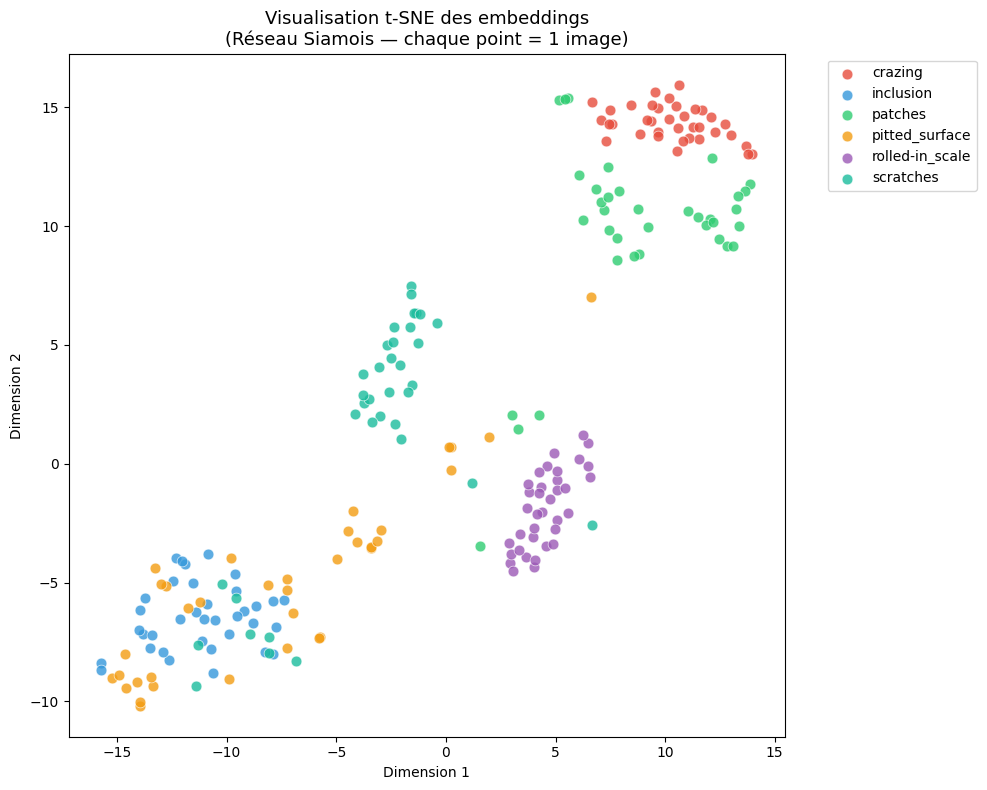

✓ t-SNE terminé !


In [38]:
from sklearn.manifold import TSNE

# 1. EXTRAIRE LES EMBEDDINGS
print("Extraction des embeddings...")
embeddings = encoder.predict(X_test, verbose=1)
print(f"Forme embeddings : {embeddings.shape}")
# → (216, 128)

# 2. NORMALISER LES EMBEDDINGS
embeddings_norm = embeddings / (
    np.linalg.norm(embeddings, axis=1, keepdims=True) + 1e-8)

# 3. DISTANCE COSINUS ENTRE CLASSES
print("\nDistance cosinus moyenne entre classes :")
y_test_classes = y_test.argmax(axis=1)

for i in range(6):
    for j in range(i+1, 6):
        emb_i = embeddings_norm[y_test_classes == i]
        emb_j = embeddings_norm[y_test_classes == j]
        # Moyenne des distances cosinus
        dist = 1 - np.mean(emb_i @ emb_j.T)
        print(f"  {CLASSES[i]} vs {CLASSES[j]} : {dist:.3f}")

# 4. T-SNE — RÉDUCTION À 2D
print("\nCalcul t-SNE...")
tsne = TSNE(n_components=2, random_state=42,
            perplexity=30, n_iter=1000)
embeddings_2d = tsne.fit_transform(embeddings_norm)

# 5. VISUALISATION
colors = ['#E74C3C', '#3498DB', '#2ECC71',
          '#F39C12', '#9B59B6', '#1ABC9C']

plt.figure(figsize=(10, 8))
for i, (cls, color) in enumerate(zip(CLASSES, colors)):
    mask = y_test_classes == i
    plt.scatter(embeddings_2d[mask, 0],
                embeddings_2d[mask, 1],
                c=color, label=cls,
                alpha=0.8, s=60, edgecolors='white',
                linewidths=0.5)

plt.title('Visualisation t-SNE des embeddings\n'
          '(Réseau Siamois — chaque point = 1 image)',
          fontsize=13)
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.xlabel('Dimension 1')
plt.ylabel('Dimension 2')
plt.tight_layout()
plt.show()

print("✓ t-SNE terminé !")

Vraie classe : scratches
Prédiction du modèle :


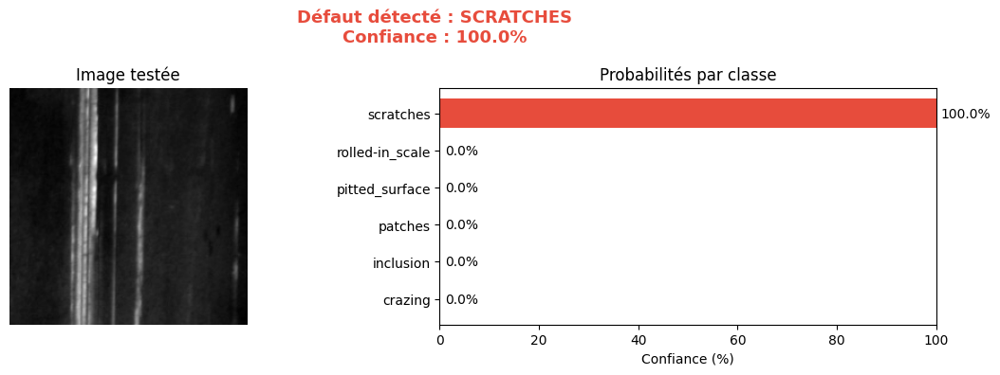


✓ Défaut détecté : scratches
✓ Confiance     : 100.0%


('scratches', np.float32(99.99957))

In [39]:
def tester_image(image_path, model, classes, img_size=224):
    """
    Tester le modèle sur une nouvelle image
    image_path : chemin de l'image à tester
    """
    # 1. Charger l'image
    img = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)

    if img is None:
        print("❌ Image non trouvée !")
        return

    # 2. Prétraitement
    img_resized = cv2.resize(img, (img_size, img_size))
    img_norm = img_resized.astype('float32') / 255.0
    img_input = img_norm.reshape(1, img_size, img_size, 1)

    # 3. Prédiction
    predictions = model2.predict(img_input, verbose=0)
    pred_class = predictions.argmax()
    confidence = predictions.max() * 100

    # 4. Affichage
    fig, axes = plt.subplots(1, 2, figsize=(12, 4))

    # Image originale
    axes[0].imshow(img_resized, cmap='gray')
    axes[0].set_title(f'Image testée', fontsize=12)
    axes[0].axis('off')

    # Graphique des probabilités
    colors = ['#E74C3C' if i == pred_class
              else '#BDC3C7' for i in range(6)]
    bars = axes[1].barh(classes, predictions[0]*100,
                        color=colors)
    axes[1].set_xlabel('Confiance (%)')
    axes[1].set_title('Probabilités par classe', fontsize=12)
    axes[1].set_xlim(0, 100)

    # Ajouter les pourcentages
    for bar, val in zip(bars, predictions[0]*100):
        axes[1].text(val + 1, bar.get_y() +
                     bar.get_height()/2,
                     f'{val:.1f}%', va='center', fontsize=10)

    plt.suptitle(
        f'Défaut détecté : {classes[pred_class].upper()}\n'
        f'Confiance : {confidence:.1f}%',
        fontsize=13, fontweight='bold',
        color='#E74C3C' if confidence > 80 else '#F39C12')

    plt.tight_layout()
    plt.show()

    print(f"\n✓ Défaut détecté : {classes[pred_class]}")
    print(f"✓ Confiance     : {confidence:.1f}%")

    return classes[pred_class], confidence

# ============================================
# TESTER SUR UNE IMAGE DU DATASET
# ============================================
# Prendre une image aléatoire du test set
import random
idx = random.randint(0, len(X_test)-1)
true_class = CLASSES[y_test[idx].argmax()]

# Sauvegarder temporairement pour tester
test_img_path = '/content/test_image.png'
cv2.imwrite(test_img_path,
            (X_test[idx].squeeze() * 255).astype(np.uint8))

print(f"Vraie classe : {true_class}")
print("Prédiction du modèle :")
tester_image(test_img_path, model2, CLASSES)

In [40]:
!pip install gradio -q


In [41]:
import gradio as gr
import numpy as np
import cv2
import matplotlib.pyplot as plt
import io
from PIL import Image

CLASSES = ['crazing', 'inclusion', 'patches',
           'pitted_surface', 'rolled-in_scale', 'scratches']

DESCRIPTIONS = {
    'crazing':        '🔴 Fissures réseau — micro-craquelures sur la surface',
    'inclusion':      '🟠 Inclusions — particules étrangères incrustées',
    'patches':        '🟡 Taches — zones décolorées ou irrégulières',
    'pitted_surface': '🟢 Surface piquée — petits cratères ou trous',
    'rolled-in_scale':'🔵 Écailles incrustées — lamelles de métal soulevées',
    'scratches':      '🟣 Rayures — lignes profondes sur la surface',
}

def predict_defect(image):
    if image is None:
        return "Aucune image fournie", None

    # Prétraitement
    if isinstance(image, np.ndarray):
        if len(image.shape) == 3:
            image = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)

    img_resized = cv2.resize(image, (224, 224))
    img_norm = img_resized.astype('float32') / 255.0
    img_input = img_norm.reshape(1, 224, 224, 1)

    # Prédiction
    predictions = model2.predict(img_input, verbose=0)[0]
    pred_class = predictions.argmax()
    confidence = predictions.max() * 100

    # Grad-CAM
    heatmap, _ = make_gradcam_v2(img_norm.reshape(224,224,1),
                                  model2)
    heatmap_resized = cv2.resize(heatmap, (224, 224))
    heatmap_colored = cv2.applyColorMap(
        np.uint8(255*heatmap_resized), cv2.COLORMAP_JET)
    heatmap_colored = cv2.cvtColor(
        heatmap_colored, cv2.COLOR_BGR2RGB) / 255.0
    img_rgb = np.stack([img_norm.reshape(224,224)]*3, axis=-1)
    superimposed = np.clip(img_rgb*0.6 + heatmap_colored*0.4, 0, 1)
    superimposed = (superimposed * 255).astype(np.uint8)

    # Graphique probabilités
    fig, ax = plt.subplots(figsize=(7, 3))
    colors = ['#E74C3C' if i == pred_class
              else '#BDC3C7' for i in range(6)]
    bars = ax.barh(CLASSES, predictions*100, color=colors)
    ax.set_xlabel('Confiance (%)')
    ax.set_xlim(0, 105)
    for bar, val in zip(bars, predictions*100):
        ax.text(val+1, bar.get_y()+bar.get_height()/2,
                f'{val:.1f}%', va='center', fontsize=9)
    ax.set_title('Probabilités par classe')
    plt.tight_layout()

    # Convertir graphique en image
    buf = io.BytesIO()
    plt.savefig(buf, format='png', dpi=100)
    buf.seek(0)
    chart_img = Image.open(buf)
    plt.close()

    # Résultat texte
    result_text = f"""
## Résultat de l'analyse

**Défaut détecté : {CLASSES[pred_class].upper()}**

**Confiance : {confidence:.1f}%**

{DESCRIPTIONS[CLASSES[pred_class]]}

---
### Toutes les probabilités :
"""
    for i, (cls, prob) in enumerate(zip(CLASSES, predictions)):
        bar = "█" * int(prob * 20)
        result_text += f"\n**{cls}** : {prob*100:.1f}%  {bar}"

    return result_text, superimposed, chart_img

# Interface Gradio
with gr.Blocks(title="Détection de Défauts Industriels") as demo:
    gr.Markdown("""
    # 🔍 Détection de Défauts sur Pièces Métalliques
    ### Modèle CNN — Précision : 99.07% | Dataset NEU
    Uploadez une image de surface métallique pour détecter automatiquement le type de défaut.
    """)

    with gr.Row():
        with gr.Column():
            input_image = gr.Image(
                label="📷 Image à analyser",
                type="numpy")
            analyze_btn = gr.Button(
                "🔍 Analyser", variant="primary")

        with gr.Column():
            result_text = gr.Markdown(
                label="Résultat")

    with gr.Row():
        gradcam_output = gr.Image(
            label="🗺️ Carte Grad-CAM (zones d'attention)")
        chart_output = gr.Image(
            label="📊 Probabilités par classe")

    analyze_btn.click(
        fn=predict_defect,
        inputs=input_image,
        outputs=[result_text, gradcam_output, chart_output]
    )

    gr.Markdown("""
    ### Classes de défauts détectables :
    | Classe | Description |
    |--------|-------------|
    | Crazing | Fissures réseau |
    | Inclusion | Particules étrangères |
    | Patches | Taches irrégulières |
    | Pitted Surface | Surface piquée |
    | Rolled-in Scale | Écailles incrustées |
    | Scratches | Rayures |
    """)

demo.launch(share=True)

Colab notebook detected. To show errors in colab notebook, set debug=True in launch()
* Running on public URL: https://a8ddd74c4bba104ab8.gradio.live

This share link expires in 1 week. For free permanent hosting and GPU upgrades, run `gradio deploy` from the terminal in the working directory to deploy to Hugging Face Spaces (https://huggingface.co/spaces)


In [43]:
import os

# Créer le dossier d'abord
os.makedirs('/content/drive/MyDrive/projet_NEU/', exist_ok=True)

# Sauvegarder le modèle
model2.save('/content/drive/MyDrive/projet_NEU/model_NEU_final.keras')

print("✓ Modèle sauvegardé !")
print("Contenu du dossier :")
for f in os.listdir('/content/drive/MyDrive/projet_NEU/'):
    print(f"  → {f}")

✓ Modèle sauvegardé !
Contenu du dossier :
  → model_NEU_final.keras
